<a href="https://colab.research.google.com/github/moey920/CashCow_FieldPractice/blob/haram/Detectron2__haram(0327).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 노하람 인턴 테스트용 노트입니다. 혹시 이 노트가 공유되고 있다면 잔디로 알려주시면 감사하겠습니다.

# 2. Detectron2 설치하기

In [0]:
# 종속 패키지(dependencies) 설치, 설치후에 Restart Runtime이 나오면 클릭해줍니다.
!pip install -U torch torchvision cython
!pip install -U 'git+https://github.com/facebookresearch/fvcore.git' 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
torch.__version__

Requirement already up-to-date: torch in /usr/local/lib/python3.6/dist-packages (1.4.0)
Requirement already up-to-date: torchvision in /usr/local/lib/python3.6/dist-packages (0.5.0)
     |████████████████████████████████| 2.1MB 99kB/s 
  Found existing installation: Cython 0.29.15
    Uninstalling Cython-0.29.15:
      Successfully uninstalled Cython-0.29.15
  Cloning https://github.com/facebookresearch/fvcore.git to /tmp/pip-req-build-go75uo5c
  Running command git clone -q https://github.com/facebookresearch/fvcore.git /tmp/pip-req-build-go75uo5c
  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-m_kyxbcy
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-m_kyxbcy
     |████████████████████████████████| 276kB 32.9MB/s 
  Created wheel for fvcore: filename=fvcore-0.1-cp36-none-any.whl size=42829 sha256=50e5b17570f8895cd6d38eb752d50e61bc350c40d81a46a74703759eb56b4c6d
  Stored in directory: /tmp/pip-ephem-wheel-cache-lky7

'1.4.0'

In [0]:
# Detectiorn2 repo 클론, 인스톨
!git clone https://github.com/facebookresearch/detectron2 detectron2_repo
!pip install -e detectron2_repo

Cloning into 'detectron2_repo'...
remote: Enumerating objects: 27, done.
remote: Counting objects: 100% (27/27), done.
remote: Compressing objects: 100% (25/25), done.
remote: Total 3553 (delta 6), reused 14 (delta 2), pack-reused 3526
Receiving objects: 100% (3553/3553), 2.15 MiB | 406.00 KiB/s, done.
Resolving deltas: 100% (2446/2446), done.
Obtaining file:///content/detectron2_repo
  Running setup.py develop for detectron2


In [0]:
# 인스톨이 완료되면 Colab Runtime을 다시 시작해주세요. 

# 기본 설정
# detectron2 logger 설정
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# 자주 사용하는 라이브러리 임폴트
import numpy as np
import cv2
import random
import os
from google.colab.patches import cv2_imshow

# 자주 사용하는 detectron2 유틸 임폴트 
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# 1. Google Drive Api

In [0]:
# Google Drive api 활용, PyDrive package 인스톨
!pip install -U -q PyDrive

In [0]:
# Auth 승인을 받습니다. 코드 실행 시 링크가 나오면 들어가서 계정을 인증하고 인증 코드를 복사해 붙여넣습니다.
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
   
# PyDrive Authentication
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
# Folder Id로 FileList 받아오기
# 폴더 ID는 개인 드라이브에서 폴더에 들어가면 https://drive.google.com/drive/folders/ 이후에 나오는 주소입니다.

folder_id = '1R4bFN-68jn0Ug-gX4nWYTV0C87x6QN_2'
   
def ListFolder(parent):
    filelist=[]
    file_list = drive.ListFile({'q': "'%s' in parents and trashed=false" % parent}).GetList()
    for f in file_list:
        if f['mimeType']=='application/vnd.google-apps.folder': # if folder
            filelist.append({"id":f['id'],"title":f['title'],"list":ListFolder(f['id'])})
        else:
            filelist.append({"title":f['title'],"id":f['id']})
    return filelist
   
   
file_lists = ListFolder(folder_id)

In [0]:
# Local (colaboratory) directory 지정
# choose a local (colab) directory to store the data.
import os

local_download_path = os.path.expanduser('')
try:
	os.makedirs(local_download_path)
except: pass

In [0]:
# Filename 저장, 여기까지 하면 구글 드라이브 폴더 내의 파일을 Colab에 지정한 장소에 업로드 됩니다.
ret = []
for file in file_lists:
    print('title: %s, id: %s' % (file['title'], file['id']))
    fname = os.path.join(local_download_path, file['title'])
    print('downloading to {}'.format(fname))
    f_ = drive.CreateFile({'id': file['id']})
    f_.GetContentFile(fname)
    print(fname)
    ret.append(fname)

title: coco_instances_results.json, id: 1hNuvq2Iy0DvpB63z9u6jBmJEDo2A74lS
downloading to coco_instances_results.json
coco_instances_results.json
title: coco_instances_results.json, id: 1J_C3btlceeRrdg5lE5ESy5CXW4F2OU-n
downloading to coco_instances_results.json
coco_instances_results.json
title: coco_instances_results.json, id: 1nIm14_ePpSgqytmjLrm3ZT1N7kF_apSM
downloading to coco_instances_results.json
coco_instances_results.json
title: model_final.pth, id: 19cKH3vgRNTCJz6_NSoH6QtL7vvVj435q
downloading to model_final.pth
model_final.pth
title: metrics.json, id: 1T-CS9qshdtkgAObM7YuCEef6RDNgabjt
downloading to metrics.json
metrics.json
title: last_checkpoint, id: 1owxW7Z2NlyB-AlKnKs1ec3kg3Ys9Q562
downloading to last_checkpoint
last_checkpoint
title: instances_predictions.pth, id: 1somrG8VDFM-lFRfjlTcqOo4xciX48Bzq
downloading to instances_predictions.pth
instances_predictions.pth
title: dataset.zip, id: 1zJScCWxOHfk0vRLnLGM6xRpTQiUKyGWw
downloading to dataset.zip
dataset.zip


In [0]:
#import os
#os.chdir('receipt')
!ls

adc.json		     detectron2_repo		metrics.json
coco_instances_results.json  instances_predictions.pth	model_final.pth
dataset.zip		     last_checkpoint		sample_data


In [0]:
# 업로드한 파일을 압축해제합니다.
!unzip dataset.zip > /dev/null

In [0]:
#os.chdir('../')
!ls

adc.json		     detectron2_repo		metrics.json	 train
coco_instances_results.json  instances_predictions.pth	model_final.pth  val
dataset.zip		     last_checkpoint		sample_data


# 커스텀 데이터셋 학습하기

In [0]:
# 인스톨이 완료되면 Colab Runtime을 다시 시작해주세요. 

# 기본 설정
# detectron2 logger 설정
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# 자주 사용하는 라이브러리 임폴트
import numpy as np
import cv2
import random
import os
from google.colab.patches import cv2_imshow
import matplotlib
import json

# 자주 사용하는 detectron2 유틸 임폴트 
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

In [0]:
import os
import numpy as np
import json
from detectron2.structures import BoxMode
import itertools
import cv2

def get_receipt_dicts(img_path,json_path):
    '''
    AD Oct 2019 : loading function to calculate the bboxes from the masks (as it does not exist so far in Detectron2)
    expected format:
    
    {'file_name': 'path/to/image',
    'height' : imgheight,
    'width': imgwidth,
    'annotations':
    [{'bbox': [xmin,ymin,xmax,ymax], 'bbox_mode': <BoxMode.XYXY_ABS: 0>,
    'segmentation': [[polygon/coordinates/x/y]],
    'category_id': 0, 'iscrowd': 0}, 
    {'bbox': [xmin2,ymin2,xmax2,ymax2], 'bbox_mode': <BoxMode.XYXY_ABS: 0>,
    'segmentation': [[polygon2/coordinates/x/y]],
    'category_id': 0, 'iscrowd': 0},
    
    etc ...]
    
    }
    INPUTS:
        img_path . str, path to the images
        json_path. str, path to the json annotation file (coco format)
    
    '''
    
    with open(json_path) as f:
        imgs_anns = json.load(f)
    dataset_dicts = []
    
    for img in imgs_anns['images']:
        record = {}
        
        filename = os.path.join(img_path,img['file_name'])
        height, width = cv2.imread(filename).shape[:2]
        image_id = img['id']

        record["file_name"] = filename
        record["height"] = height
        record["width"] = width
        
        for annos in imgs_anns['annotations']:
            if annos['image_id'] == image_id:

                objs = []
                poly = annos['segmentation']
                 
                for p in poly:
                    bbox=[]
                    x, y = p[::2] , p[1::2]
                    bbox.append(np.min(x))
                    bbox.append(np.min(y))
                    bbox.append(np.max(x))
                    bbox.append(np.max(y))
                    obj = {"bbox": bbox,
                            "bbox_mode": BoxMode.XYXY_ABS,
                            "segmentation": [p],
                            "category_id": 0,
                            "iscrowd": 0}
                    objs.append(obj)

        
        record["annotations"] = objs
        dataset_dicts.append(record)
    return dataset_dicts

from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.data.datasets import register_coco_instances

register_coco_instances("train", {}, "train/receipt_coco.json",
                        "train/")

register_coco_instances("val", {}, "val/receipt_coco.json",
                        "val/")

receipt_metadata_train = MetadataCatalog.get("train")
receipt_metadata_val = MetadataCatalog.get("val")

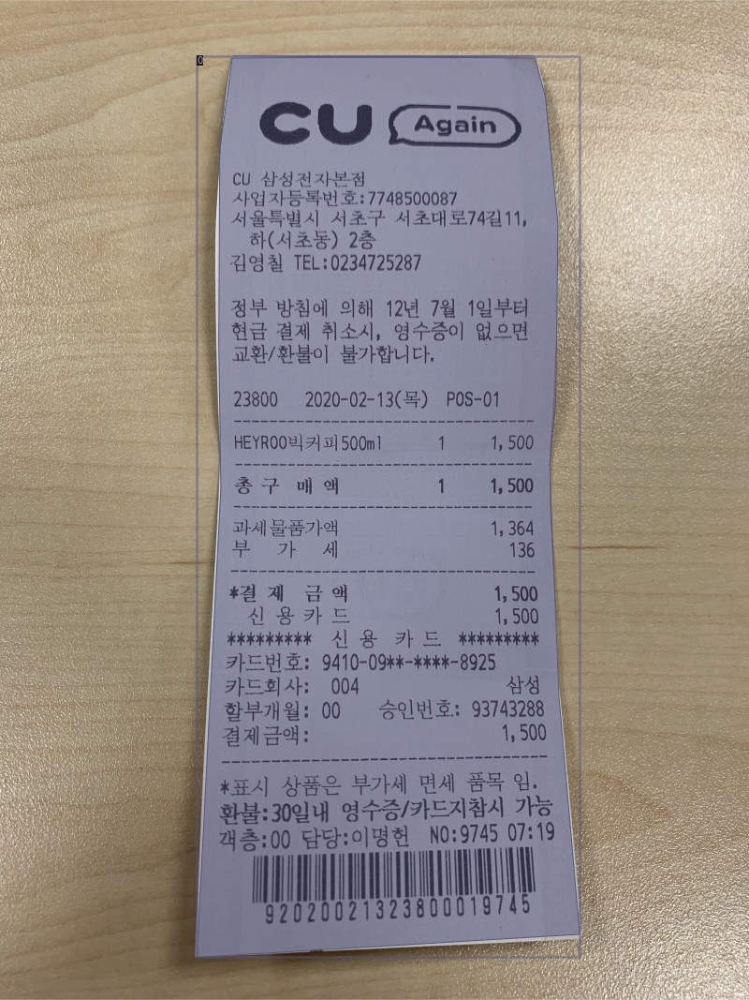

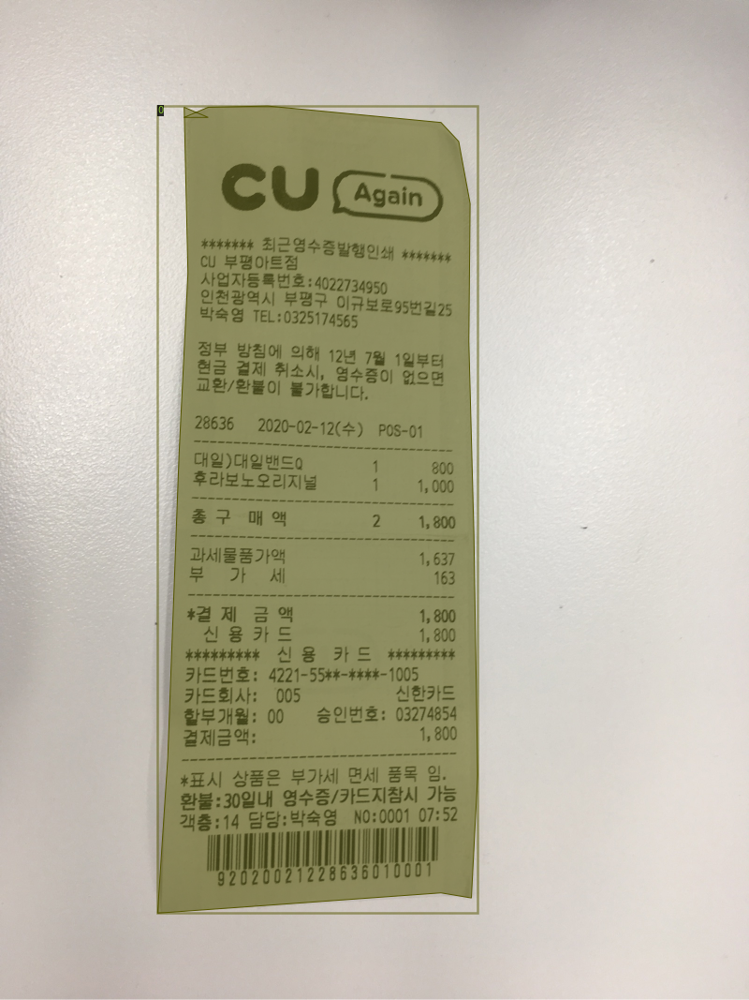

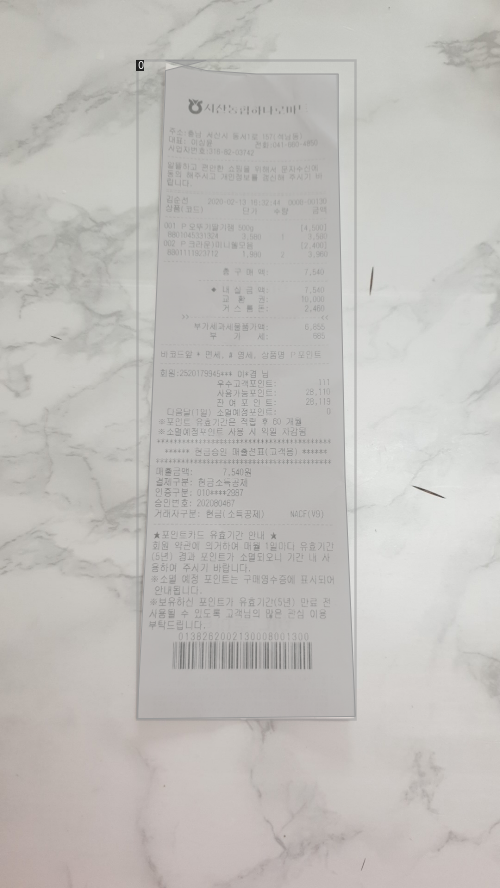

In [0]:
dataset_dicts = get_receipt_dicts("train","train/receipt_coco.json")
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], receipt_metadata_train, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

# Object Detection

In [0]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-Detection/retinanet_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"   # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 900
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # 클래스는 "영수증" 클래스 하나 뿐입니다.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

Loading config ./detectron2_repo/configs/COCO-Detection/../Base-RetinaNet.yaml with yaml.unsafe_load. Your machine may be at risk if the file contains malicious content.


[03/26 06:00:04 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

model_final_f10217.pkl: 178MB [00:20, 8.81MB/s]                           


[03/26 06:00:29 d2.engine.train_loop]: Starting training from iteration 0
[03/26 06:00:42 d2.utils.events]:  eta: 0:08:04  iter: 19  total_loss: 1.398  loss_cls: 1.105  loss_box_reg: 0.324  time: 0.5356  data_time: 0.0257  lr: 0.000005  max_mem: 3699M
[03/26 06:00:52 d2.utils.events]:  eta: 0:07:53  iter: 39  total_loss: 1.951  loss_cls: 1.527  loss_box_reg: 0.422  time: 0.5409  data_time: 0.0045  lr: 0.000010  max_mem: 3699M
[03/26 06:01:03 d2.utils.events]:  eta: 0:07:43  iter: 59  total_loss: 2.006  loss_cls: 1.561  loss_box_reg: 0.462  time: 0.5445  data_time: 0.0056  lr: 0.000015  max_mem: 3699M
[03/26 06:01:15 d2.utils.events]:  eta: 0:07:34  iter: 79  total_loss: 2.062  loss_cls: 1.576  loss_box_reg: 0.471  time: 0.5495  data_time: 0.0048  lr: 0.000020  max_mem: 3786M
[03/26 06:01:26 d2.utils.events]:  eta: 0:07:27  iter: 99  total_loss: 1.991  loss_cls: 1.584  loss_box_reg: 0.428  time: 0.5535  data_time: 0.0046  lr: 0.000025  max_mem: 3786M
[03/26 06:01:38 d2.utils.events]:  e

In [0]:
# tensorboard를 사용해서 학습 커브를 살펴봅니다.
%load_ext tensorboard
%tensorboard --logdir output

In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("val", )
predictor = DefaultPredictor(cfg)

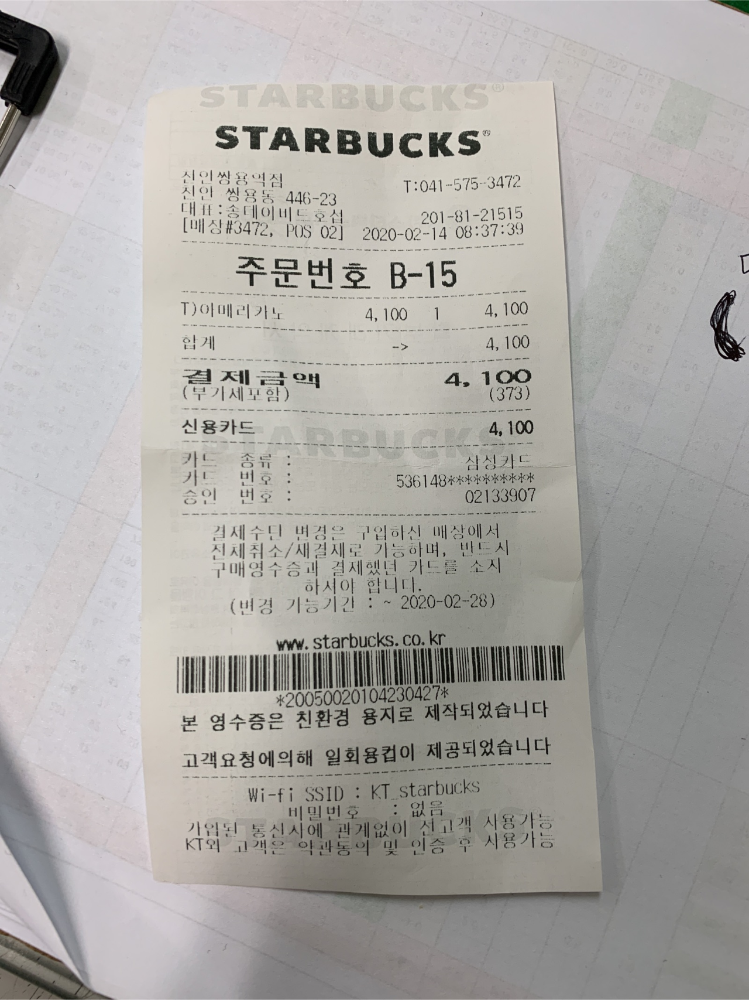

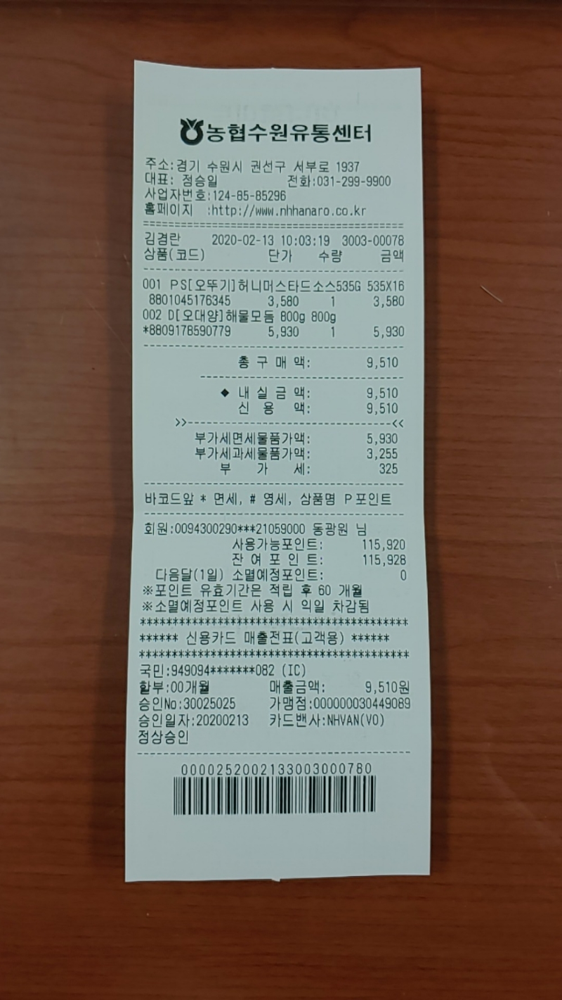

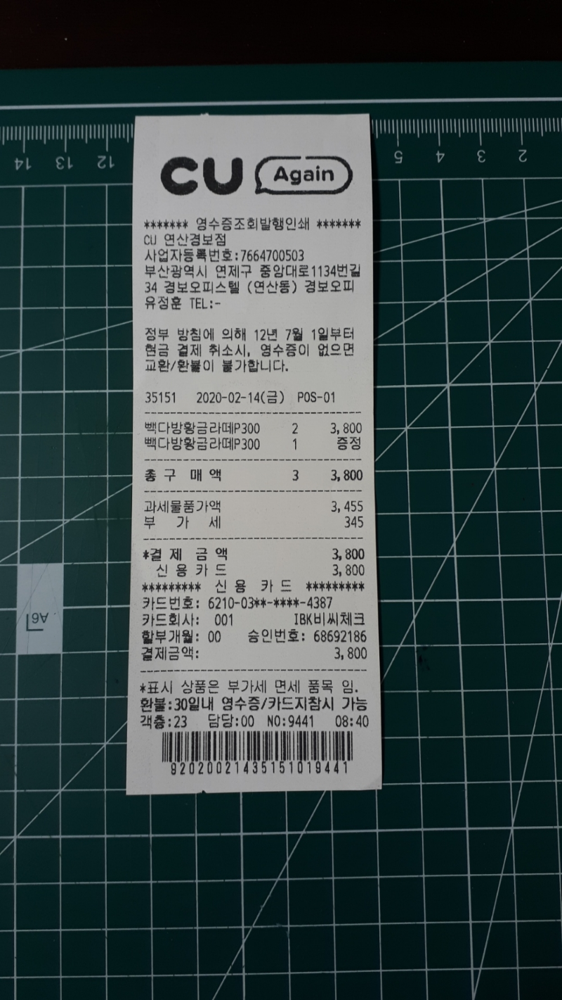

In [0]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = get_receipt_dicts("val","val/receipt_coco.json")
for d in random.sample(dataset_dicts, 3):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=receipt_metadata_train, 
                   scale=0.8
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

In [0]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "val")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

[03/26 06:09:50 d2.data.datasets.coco]: Loaded 100 images in COCO format from val/receipt_coco.json
[03/26 06:09:50 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|  receipt   | 100          |
|            |              |
[03/26 06:09:50 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...
[03/26 06:09:50 d2.data.common]: Serialized dataset takes 0.05 MiB
[03/26 06:09:50 d2.evaluation.evaluator]: Start inference on 100 images
[03/26 06:09:53 d2.evaluation.evaluator]: Inference done 11/100. 0.1881 s / img. ETA=0:00:16
[03/26 06:09:58 d2.evaluation.evaluator]: Inference done 37/100. 0.1859 s / img. ETA=0:00:12
[03/26 06:10:03 d2.evaluation.evaluator]: Inference done 63/100. 0.1874 s / img. ETA=0:00:07
[03/26 06:10:08 d2.evaluation.evaluator]: Inference done 88/100. 0.1901 s / img. ETA=0:00:02
[03/26 06:10:11 d2.evaluation.evaluator]: Total inference time: 0:00:18.769846 (0.

OrderedDict([('bbox',
              {'AP': 68.68117061221717,
               'AP50': 99.99019703950593,
               'AP75': 89.162576182068,
               'APl': 68.68117061221717,
               'APm': nan,
               'APs': nan})])

# Instance Segmentation

이제 학습을 진행할 단계입니다. COCO 데이터셋으로 학습된 R50-FPN Mask R-CNN 모델을 불러와서 영수증 데이터셋으로 fine-tune해 봅시다. Colab의 K80 GPU를 기준으로, 300 iterations 학습시키는데 대략 6분정도의 시간이 소요됩니다(P100 GPU의 경우 2분 가량 소요됩니다).

In [0]:
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg

cfg = get_cfg()
cfg.merge_from_file("./detectron2_repo/configs/COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")
cfg.DATASETS.TRAIN = ("train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = "detectron2://COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x/137849600/model_final_f10217.pkl"  # initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 900    # 300 iterations 정도면 충분합니다. 더 오랜 시간도 시도해보세요.
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 1024   # 영수증 데이터셋과 같이 적당한 데이터셋에서는 이정도면 적당합니다, 작은 데이터셋은 124로 하면 됩니다.
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1  # 클래스는 "영수증" 클래스 하나 뿐입니다.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[03/26 06:10:12 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

'roi_heads.box_predictor.cls_score.weight' has shape (81, 1024) in the checkpoint but (2, 1024) in the model! Skipped.
'roi_heads.box_predictor.cls_score.bias' has shape (81,) in the checkpoint but (2,) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.weight' has shape (320, 1024) in the checkpoint but (4, 1024) in the model! Skipped.
'roi_heads.box_predictor.bbox_pred.bias' has shape (320,) in the checkpoint but (4,) in the model! Skipped.
'roi_heads.mask_head.predictor.weight' has shape (80, 256, 1, 1) in the checkpoint but (1, 256, 1, 1) in the model! Skipped.
'roi_heads.mask_head.predictor.bias' has shape (80,) in the checkpoint but (1,) in the model! Skipped.


[03/26 06:10:12 d2.engine.train_loop]: Starting training from iteration 0
[03/26 06:10:25 d2.utils.events]:  eta: 0:09:53  iter: 19  total_loss: 1.367  loss_cls: 0.625  loss_box_reg: 0.037  loss_mask: 0.689  loss_rpn_cls: 0.001  loss_rpn_loc: 0.010  time: 0.6713  data_time: 0.0292  lr: 0.000005  max_mem: 3787M
[03/26 06:10:38 d2.utils.events]:  eta: 0:09:25  iter: 39  total_loss: 1.205  loss_cls: 0.498  loss_box_reg: 0.040  loss_mask: 0.650  loss_rpn_cls: 0.001  loss_rpn_loc: 0.008  time: 0.6551  data_time: 0.0048  lr: 0.000010  max_mem: 3787M
[03/26 06:10:51 d2.utils.events]:  eta: 0:09:10  iter: 59  total_loss: 0.932  loss_cls: 0.310  loss_box_reg: 0.034  loss_mask: 0.569  loss_rpn_cls: 0.002  loss_rpn_loc: 0.009  time: 0.6534  data_time: 0.0056  lr: 0.000015  max_mem: 3787M
[03/26 06:11:04 d2.utils.events]:  eta: 0:08:48  iter: 79  total_loss: 0.739  loss_cls: 0.213  loss_box_reg: 0.043  loss_mask: 0.492  loss_rpn_cls: 0.001  loss_rpn_loc: 0.008  time: 0.6444  data_time: 0.0054  lr:

In [0]:
# tensorboard를 사용해서 학습 커브를 살펴봅니다.
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 882), started 0:10:15 ago. (Use '!kill 882' to kill it.)

# 학습한 모델 실행 및 평가하기

영수증 데이터셋의 검증(validation) 데이터셋으로 테스트를 해볼 차례입니다.

우선, 방금 전 학습한 모델을 불러와서 predictor를 생성합니다.

In [0]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
cfg.DATASETS.TEST = ("val", )
predictor = DefaultPredictor(cfg)

샘플을 몇 개 뽑아 살펴봅니다.

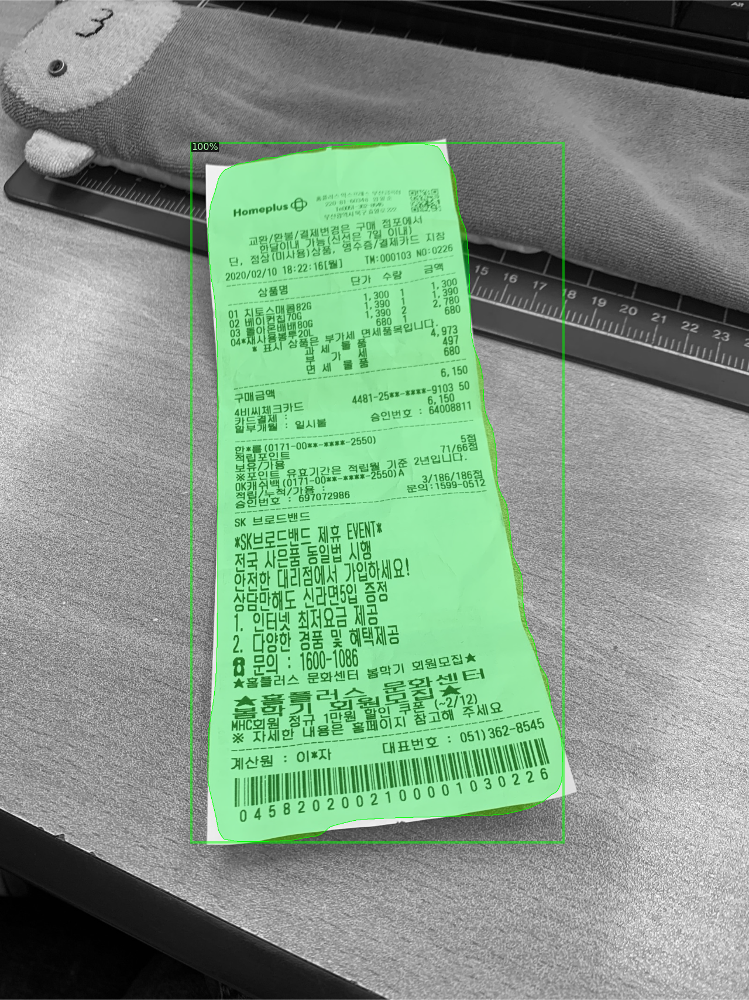

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


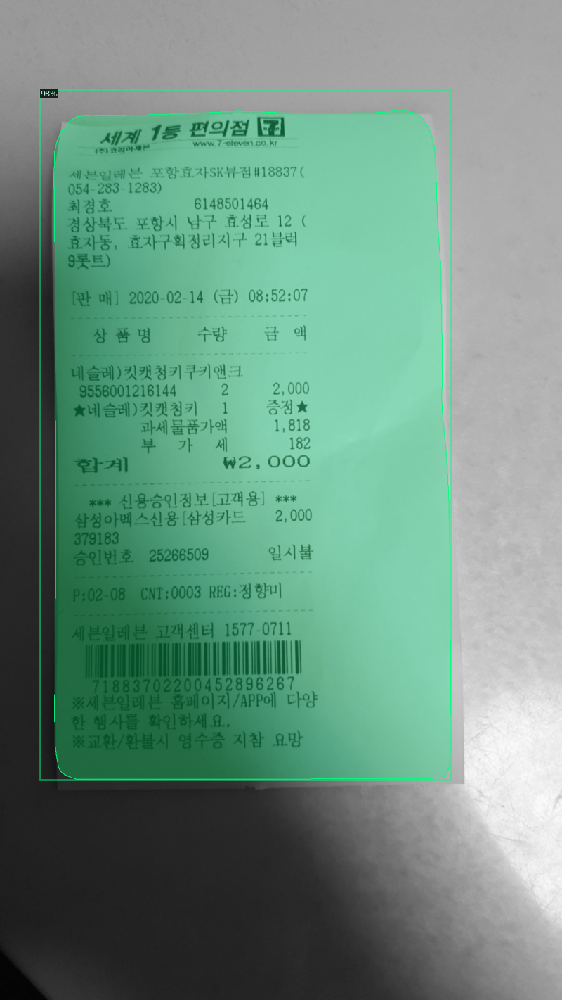

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


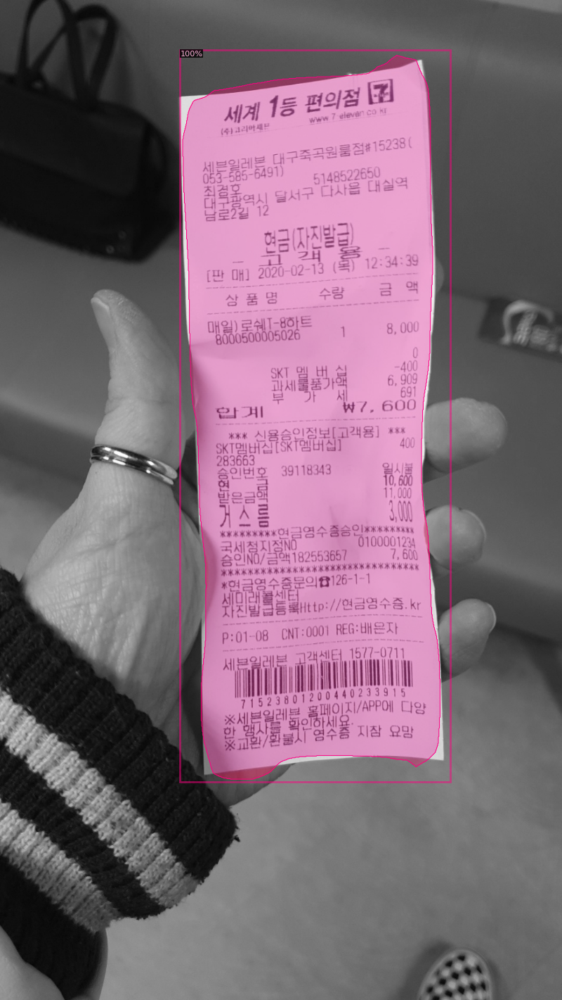

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


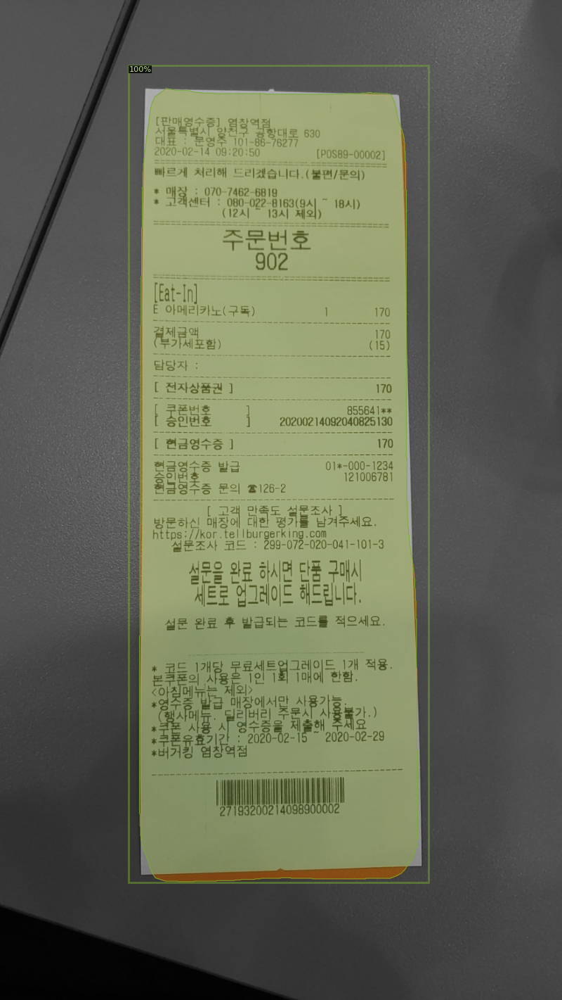

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


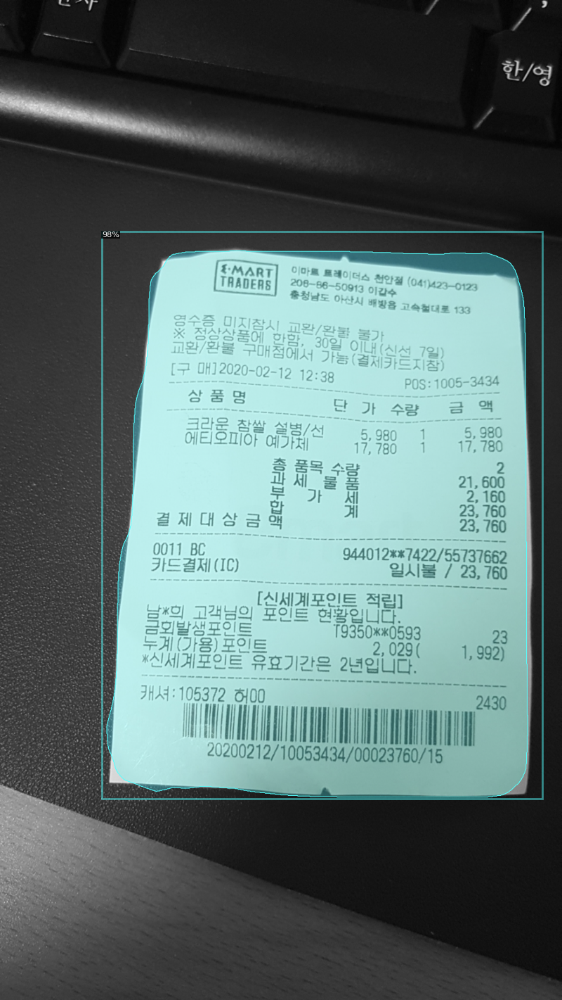

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


In [0]:
from detectron2.utils.visualizer import ColorMode
from detectron2.utils.visualizer import GenericMask
from detectron2.utils.visualizer import VisImage
from detectron2.structures import BitMasks, Boxes, BoxMode, Keypoints, PolygonMasks, RotatedBoxes
dataset_dicts = get_receipt_dicts("val","val/receipt_coco.json")
for d in random.sample(dataset_dicts, 5):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=receipt_metadata_train, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
                   #instance_mode=ColorMode.SEGMENTATION
                   #instance_mode = GenericMask.mask_to_polygons

    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])
    VisImage.save(v, "./output/")

In [0]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("val", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "val")
inference_on_dataset(trainer.model, val_loader, evaluator)
# another equivalent way is to use trainer.test

[03/26 06:20:10 d2.data.datasets.coco]: Loaded 100 images in COCO format from val/receipt_coco.json
[03/26 06:20:10 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...
[03/26 06:20:10 d2.data.common]: Serialized dataset takes 0.05 MiB
[03/26 06:20:10 d2.evaluation.evaluator]: Start inference on 100 images
[03/26 06:20:12 d2.evaluation.evaluator]: Inference done 11/100. 0.1384 s / img. ETA=0:00:13
[03/26 06:20:17 d2.evaluation.evaluator]: Inference done 41/100. 0.1344 s / img. ETA=0:00:09
[03/26 06:20:22 d2.evaluation.evaluator]: Inference done 72/100. 0.1349 s / img. ETA=0:00:04
[03/26 06:20:27 d2.evaluation.evaluator]: Total inference time: 0:00:15.844177 (0.166781 s / img per device, on 1 devices)
[03/26 06:20:27 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:12 (0.134752 s / img per device, on 1 devices)
[03/26 06:20:27 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[03/26 06:20:27 d2.evaluation.coco_eval

OrderedDict([('bbox',
              {'AP': 86.70545855829116,
               'AP50': 100.0,
               'AP75': 100.0,
               'APl': 86.70545855829116,
               'APm': nan,
               'APs': nan}),
             ('segm',
              {'AP': 99.48193445384133,
               'AP50': 100.0,
               'AP75': 100.0,
               'APl': 99.48193445384133,
               'APm': nan,
               'APs': nan})])

In [0]:
!ls output

coco_instances_results.json			   last_checkpoint
events.out.tfevents.1585202409.ca519d7dc66b.583.0  metrics.json
events.out.tfevents.1585203012.ca519d7dc66b.583.1  model_final.pth
instances_predictions.pth


# 구글 드라이브에 모델 저장하기

In [0]:
# 1. Authenticate and create the PyDrive client.
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

# 2. Create & upload a file text file.
# 특정 폴더 안으로 파일 삽입
uploaded = drive.CreateFile({'title': 'coco_instances_results.json', "parents": [{"kind": "drive#fileLink","id": '1R4bFN-68jn0Ug-gX4nWYTV0C87x6QN_2'}]})
uploaded.SetContentString('Sample upload file content')
uploaded.SetContentFile('output/coco_instances_results.json')
uploaded.Upload()
print('Uploaded file with ID {}'.format(uploaded.get('id')))
# 3. Load a file by ID and print its contents.
downloaded = drive.CreateFile({'id': uploaded.get('id')})

Uploaded file with ID 1Qj163nk-DbDAt9-p9UqNNWxrCvElbkCp


In [0]:
for key in outputs.keys():
    print(key, ":", outputs[key])
    print(outputs['instances'].pred_masks)

instances : Instances(num_instances=1, image_height=1777, image_width=1000, fields=[pred_boxes: Boxes(tensor([[ 202.5380,  144.4517,  746.9658, 1438.3547]], device='cuda:0')), scores: tensor([0.9990], device='cuda:0'), pred_classes: tensor([0], device='cuda:0'), pred_masks: tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]]], device='cuda:0')])
tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, Fal

In [0]:
with open('output/coco_instances_results.json') as f :
    json_data = json.load(f)
json_data

[{'bbox': [241.7987060546875,
   6.6055908203125,
   1042.9246826171875,
   2069.548828125],
  'category_id': 1,
  'image_id': 1,
  'score': 0.9984400868415833,
  'segmentation': {'counts': 'Uk`a05VR2i0lUO8S@b0f=d1_AZOc<a2bB^No;o2RCYN^;o2dC^Nd:W3VDUNd9U4mD]M\\8a5kEQNP4a6RJjR1SNc0_O=B>C<D;F;G7J7I6I7J5K6K4K5K5L3L5L3M3N3L3N2M3N3M2M4M2M3N3M3L3N3M3L3N3M3L4M3M3L4M3M3M4K4M2N2M3N2N2N1N3N1O2N1N3N001O001O001O00001O001N10001O00001O00001O00001O000O2O00001O00001O0000001O00000000000000000000000000000001O0000000000000000000000000000000010O0000000000000000000000O1000000000000000000000000000000000000000000000000000001O0000000000O100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001O000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001O000000000000000000000000000000000000000000000000000000000000

# BBOX CROP

In [0]:
import os

i=1
for d in dataset_dicts:    
    im = cv2.imread(d["file_name"])
    output = predictor(im)
    pts = output["instances"].pred_boxes.tensor[0].tolist()
   # crop_img = im[int(pts[1])-1:int(pts[3])+1, int(pts[0])-1:int(pts[2])+1] 
    crop_img = im[int(pts[1]):int(pts[3]), int(pts[0]):int(pts[2])] 
    cv2.imwrite('/content/drive/My Drive/img/crop'+ str(i) + '.jpg',crop_img)
    i=i+1

    #print(len(pts))
    #print(len(crop_img))

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
i = 0
for d in dataset_dicts:    
    im = cv2.imread(d["file_name"])
    output = predictor(im)
    pts = output["instances"].pred_boxes.tensor[0].tolist()
    print(pts)
    i =i+1
print(i)

[241.586669921875, 6.2171630859375, 1284.7449951171875, 2076.31640625]
[258.78338623046875, 70.52062225341797, 778.0208740234375, 1523.1915283203125]
[152.75665283203125, 222.62774658203125, 797.7772216796875, 1494.2763671875]
[234.49990844726562, 409.91583251953125, 1150.6302490234375, 1832.139404296875]
[149.36148071289062, 255.07003784179688, 771.9672241210938, 1269.9251708984375]
[116.82316589355469, 227.84841918945312, 843.4569702148438, 1289.4442138671875]
[377.0151062011719, 147.5943603515625, 1237.3035888671875, 1948.9598388671875]
[121.475341796875, 90.47749328613281, 914.826416015625, 1448.0892333984375]
[183.0304412841797, 205.91282653808594, 975.753173828125, 1438.89892578125]
[202.93777465820312, 94.6871566772461, 787.591552734375, 1470.7515869140625]
[77.4271240234375, 103.09548950195312, 818.5853271484375, 1497.387451171875]
[156.3624267578125, 35.10913848876953, 873.0614013671875, 1400.142578125]
[289.8329162597656, 152.0198974609375, 1235.2978515625, 1994.5230712890625

# Object Crop (0326)

In [0]:
import json
from collections import OrderedDict
 
with open('output/coco_instances_results.json', encoding="utf-8") as data_file:    
    data = json.load(data_file)#, object_pairs_hook=OrderedDict)


for item in data :
  print('id', item['image_id'], 'score :', item['score'],'===', 'bbox:', item['bbox'])

id 1 score : 0.9982874989509583 === bbox: [259.0106506347656, 50.2451171875, 1001.6263427734375, 2015.73828125]
id 2 score : 0.9976454377174377 === bbox: [277.831787109375, 75.69673919677734, 485.7939453125, 1429.58349609375]
id 3 score : 0.9779174327850342 === bbox: [172.11538696289062, 236.018310546875, 606.388671875, 1226.645751953125]
id 4 score : 0.9957713484764099 === bbox: [264.34283447265625, 422.73419189453125, 875.2167358398438, 1398.806640625]
id 4 score : 0.11209910362958908 === bbox: [1041.6868896484375, 0.0, 534.768798828125, 262.76153564453125]
id 5 score : 0.997890055179596 === bbox: [170.85191345214844, 245.38906860351562, 583.3118286132812, 1007.97802734375]
id 6 score : 0.9945736527442932 === bbox: [137.5845184326172, 210.8930206298828, 691.1399536132812, 1080.2109375]
id 6 score : 0.05904124304652214 === bbox: [1.3680623769760132, 963.9197998046875, 141.57716369628906, 288.0343017578125]
id 7 score : 0.9990505576133728 === bbox: [410.62188720703125, 117.099487304687

In [0]:
import json
from collections import OrderedDict
 
with open('output/coco_instances_results.json', encoding="utf-8") as data_file:    
    data = json.load(data_file)#, object_pairs_hook=OrderedDict)

for item in data :
  print(item['segmentation']['counts']+'\n')

Uk`a05VR2i0lUO8S@b0f=d1_AZOc<a2bB^No;o2RCYN^;o2dC^Nd:W3VDUNd9U4mD]M\8a5kEQNP4a6RJjR1SNc0_O=B>C<D;F;G7J7I6I7J5K6K4K5K5L3L5L3M3N3L3N2M3N3M2M4M2M3N3M3L3N3M3L3N3M3L4M3M3L4M3M3M4K4M2N2M3N2N2N1N3N1O2N1N3N001O001O001O00001O001N10001O00001O00001O00001O000O2O00001O00001O0000001O00000000000000000000000000000001O0000000000000000000000000000000010O0000000000000000000000O1000000000000000000000000000000000000000000000000000001O0000000000O100000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001O000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001O0000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000001O0000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000000

In [0]:
import os

i=1
for d in dataset_dicts:    
    im = cv2.imread(d["file_name"])
    output = predictor(im)
    #pts = output["instances"].pred_boxes.tensor[0].tolist()
    #crop_img = im[int(pts[1])-1:int(pts[3])+1, int(pts[0])-1:int(pts[2])+1] 
    crop_img = im[int(pts[1]):int(pts[3]), int(pts[0]):int(pts[2])] 
    cv2.imwrite('/content/drive/My Drive/img/crop'+ str(i) + '.jpg',crop_img)
    i=i+1
    
    #print(len(pts))
    #print(len(crop_img))
    
    #cv2.imwrite('/content/drive/My Drive/img/crop'+ str(random.randrange(1,101)) + '.jpg',crop_img)
    #cv2.imwrite('/content/drive/My Drive/img/crop'+ str(d["file_name"]) + '.jpg',crop_img)

import json
from collections import OrderedDict
 
with open('output/coco_instances_results.json', encoding="utf-8") as data_file:    
    data = json.load(data_file)#, object_pairs_hook=OrderedDict)



In [0]:
pts = []
for item in data :
  pts.append(item['segmentation']['counts'])
print(pts[100])

Qee>Q6oQ1kLiXOd5ge0ZLRXOX5Sg0eLcVO]4mh0eLcUOW4Pj0eLiTOT4kj0ZN^ROZ2Xm0U<H8G9F;C<@a0VOj0gNY1kMV2^Oa0_O`0G:I6K5L3L5L3M3N1O2N1O1O2M2O1O1O2M2O1O1N3N1O1N200O100O2O0O100O100O100O100O100O100O100O100O100O100O100O10000O10000000000O1000000000000000000000000O100000000000000O100000000000000O10000000000000000000000O1000000000000000000O10000000000000000O10000000000000000000000000000O100000000000000000000000000000000000000O10000000000000000000000000O1000000001O000000000000000000000000000O10000000000000000000000000000000000000000O10000000000000000000000000000O10000000000000000O1000000000000000000O100000000000000O1000000O10000O1000000O10000O10000O1000000O1000000O1000000O100O100O1O1O1O1O1O1O1O1O1O1O1O100O1O1000000O1000000O100000000O1000000O10000O10000O10000O1000000O100000000000000001O0000000000001O0000000000001O000000001O000000001O001O1O2M2O2N2N2N2N3L3N2N2N2N1O2M2O2N2L3N4L3L5K5K5K6Jb0]Ok0SOh0XOd0\Oc0^O?A=D;D=D>A`0_Od0SO[1VGkVOl@Rk0]<Y>h@gai`0
